# COCO Annotations Check

In [54]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import cv2
pylab.rcParams['figure.figsize'] = 20, 12


In [55]:
dataDir='/home/robonaut/data/surgical_tools/coco'
dataType='train2014'
#dataType='val2014'
annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)

In [56]:
# initialize COCO api for instance annotations
coco=COCO(annFile)

loading annotations into memory...
Done (t=0.13s)
creating index...
index created!


In [64]:
# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))


[3, 1, 2]
COCO categories: 
scissors hemostat scalpel

[{'color': '#0000ff', 'name': 'scissors', 'id': 3, 'metadata': {}, 'supercategory': None}, {'color': '#00bfbf', 'name': 'hemostat', 'id': 1, 'metadata': {}, 'supercategory': None}, {'color': '#ff0000', 'name': 'scalpel', 'id': 2, 'metadata': {}, 'supercategory': None}]


In [58]:
# get all images containing given categories, select one at random
catIds = coco.getCatIds(catNms=['scissors','hemostat','scalpel']);
imgIds = coco.getImgIds(catIds=catIds );
img = coco.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]

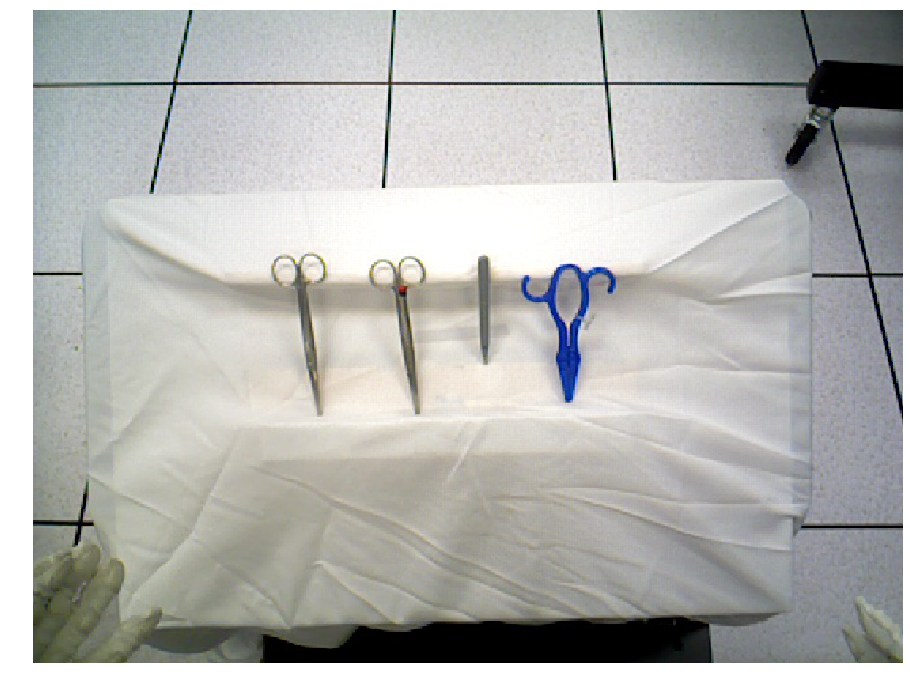

In [59]:
# load and display image
# I = io.imread('%s/images/%s/%s'%(dataDir,dataType,img['file_name']))
# use url to load image
I = io.imread(img['path'])
plt.axis('off')
plt.imshow(I)
plt.show()

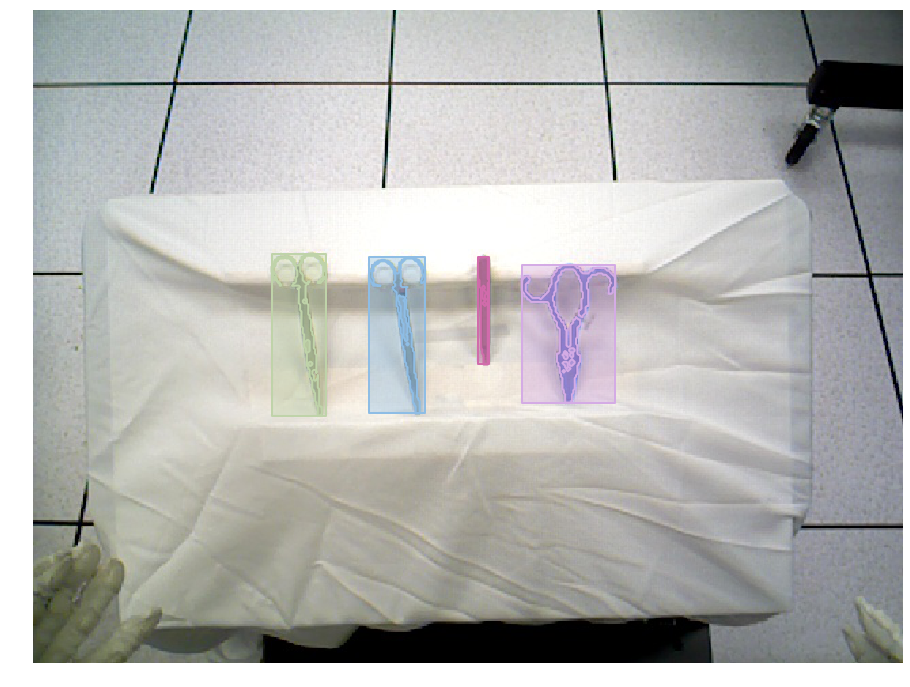

In [60]:
# load and display instance annotations
plt.imshow(I); plt.axis('off')
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns, draw_bbox=True)

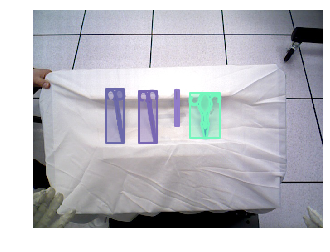

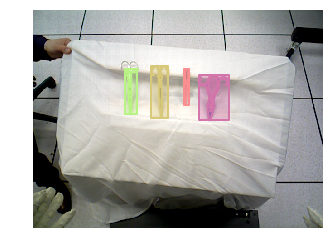

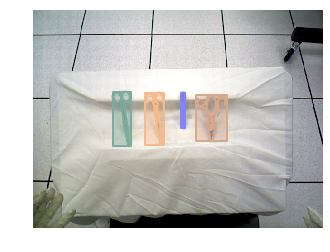

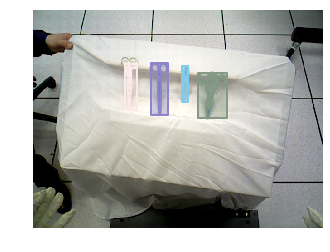

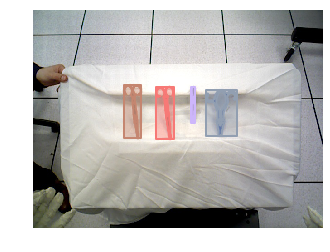

...

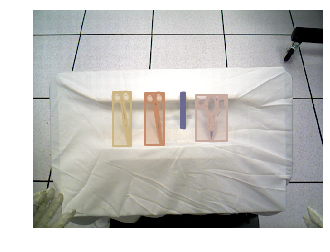

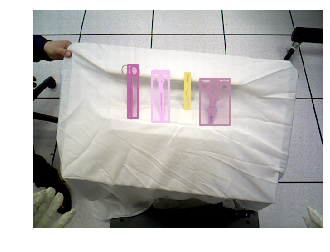

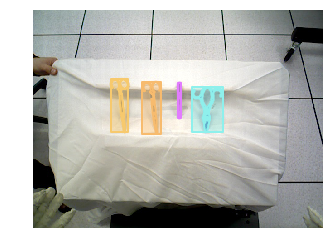

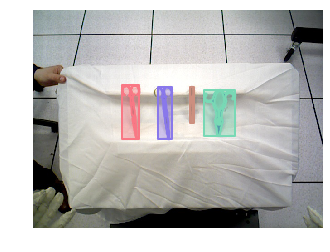

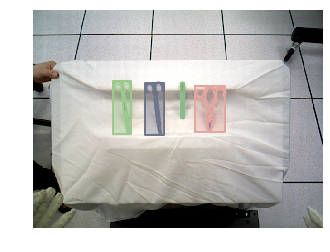

In [8]:
for j in imgIds:
    img = coco.loadImgs(imgIds[j])[0]
    I = io.imread(img['path'])
    plt.imshow(I); plt.axis('off')
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)
    coco.showAnns(anns, draw_bbox=True)
    plt.show()
    

In [69]:
#coco.getCatIds(catNms=[])
print(ann['image_id'])
coco.loadImgs(ann['image_id'])

56


[{'coco_url': None,
  'date_captured': None,
  'fickr_url': None,
  'file_name': 'img_000026.jpg',
  'height': 480,
  'id': 56,
  'license': None,
  'metadata': {},
  'path': '/home/robonaut/data/surgical_tools/coco/coco_train2014/img_000026.jpg',
  'width': 640}]

In [10]:
def rotateAndCrop(img, bbox, 
                  boarder_width = 10,
                  angle = np.random.rand()*360):

    rows, cols = img.shape[:2]
    x,y,w,h = bbox
    y0 = min(max(y - boarder_width, 0), rows)
    x0 = min(max(x - boarder_width, 0), cols)
    y1 = min(max(y + h + boarder_width, 0), rows)
    x1 = min(max(x + w + boarder_width, 0), cols)

    corners = np.array([[x0,y0,1],[x0,y1,1],[x1,y0,1],[x1,y1,1]]).T
    center = (cols/2, rows/2)
    M = cv2.getRotationMatrix2D(center,angle,1.0)
    print(M)
    img_rot = cv2.warpAffine(img, M, (cols,rows))
    corners_rot = M.dot(corners)
    x0, y0 = np.min(corners_rot.astype(int), axis = 1)
    x1, y1 = np.max(corners_rot.astype(int), axis = 1)
    print(y0,y1,x0,x1)
    img_crop = img_rot[y0:y1,x0:x1]
    return img_crop

[[-1.50399575e-01 -9.88625292e-01  6.05397934e+02]
 [ 9.88625292e-01 -1.50399575e-01 -4.02641953e+01]]
66 149 252 400


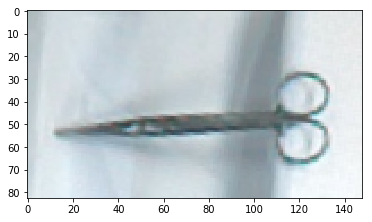

In [53]:
I = cv2.imread(img['path'])
anns = coco.loadAnns(coco.getAnnIds(img['id']))
ann = anns[1]
mask = np.stack([coco.annToMask(ann)]*3, axis=2)
#I = I*mask + 255*(1-mask)
img_crop =rotateAndCrop(I, ann['bbox'])
cv2.imwrite('/home/robonaut/pose_ws/src/object_pose_utils/scripts/img.png', img_crop)
#print(img_crop)
#plt.imshow(I)
#plt.show()
plt.imshow(img_crop)
#plt.show()

In [26]:
class_names = [cat['name'] for cat in sorted(cats, key=lambda k: k['id'])]
print(class_names)
print(cats)

['hemostat', 'scalpel', 'scissors']
[{'color': '#0000ff', 'name': 'scissors', 'id': 3, 'metadata': {}, 'supercategory': None}, {'color': '#00bfbf', 'name': 'hemostat', 'id': 1, 'metadata': {}, 'supercategory': None}, {'color': '#ff0000', 'name': 'scalpel', 'id': 2, 'metadata': {}, 'supercategory': None}]


In [ ]:
coco